In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# import ptitprince as pt

import os
os.chdir("C:/Users/sokin/Documents/Zoocamp/Mid-term project")

from sklearn.metrics import roc_auc_score, classification_report, precision_score, recall_score, accuracy_score, confusion_matrix,ConfusionMatrixDisplay

sns.set_theme()
%matplotlib inline

In [2]:
df = pd.read_csv('data.csv')

# Initial data preparation

In [3]:
df.columns = df.columns.str.lower()
df.diagnosis = (df.diagnosis == 'M').astype('int')
df = df.drop(['id', 'unnamed: 32'], axis=1)
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [4]:
# def grab_col_names(dataframe, cat_th=10, car_th=20):
#     # cat_cols, cat_but_car
    
#     categorical = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    
#     num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
#                    dataframe[col].dtypes != "O"]
#     cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
#                    dataframe[col].dtypes == "O"]
#     cat_cols = cat_cols + num_but_cat
#     cat_cols = [col for col in cat_cols if col not in cat_but_car]

#     # num_cols
#     numerical = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
#     numerical = [col for col in num_cols if col not in num_but_cat]

#     print(f"Observations: {dataframe.shape[0]}")
#     print(f"Variables: {dataframe.shape[1]}")
#     print(f'cat_cols: {len(cat_cols)}')
#     print(f'num_cols: {len(num_cols)}')
#     print(f'cat_but_car: {len(cat_but_car)}')
#     print(f'num_but_cat: {len(num_but_cat)}')

#     return cat_cols, num_cols, cat_but_car

# cat_cols, num_cols, cat_but_car = grab_col_names(df)

In [5]:
100*df.diagnosis.value_counts(normalize=True)

0    62.741652
1    37.258348
Name: diagnosis, dtype: float64

<AxesSubplot:xlabel='diagnosis', ylabel='count'>

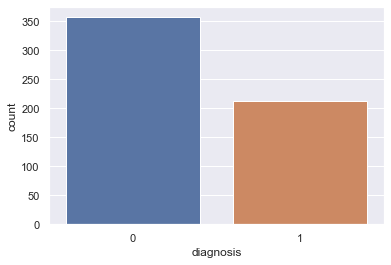

In [6]:
sns.countplot(data=df, x=df.diagnosis)

In [7]:
# df.dtypes

# Train, validation, test splits

In [8]:
from sklearn.model_selection import train_test_split

df_train_full, df_test = train_test_split(df, test_size=0.2, random_state=42)
df_train, df_val = train_test_split(df_train_full, test_size=0.25, random_state=42)

y_train = df_train.diagnosis.values
y_val = df_val.diagnosis.values
y_test = df_test.diagnosis.values

del df_train['diagnosis']
del df_val['diagnosis']
del df_test['diagnosis']

In [9]:
df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)

In [10]:
df.shape, df_train.shape, df_val.shape, df_test.shape

((569, 31), (341, 30), (114, 30), (114, 30))

# EDA

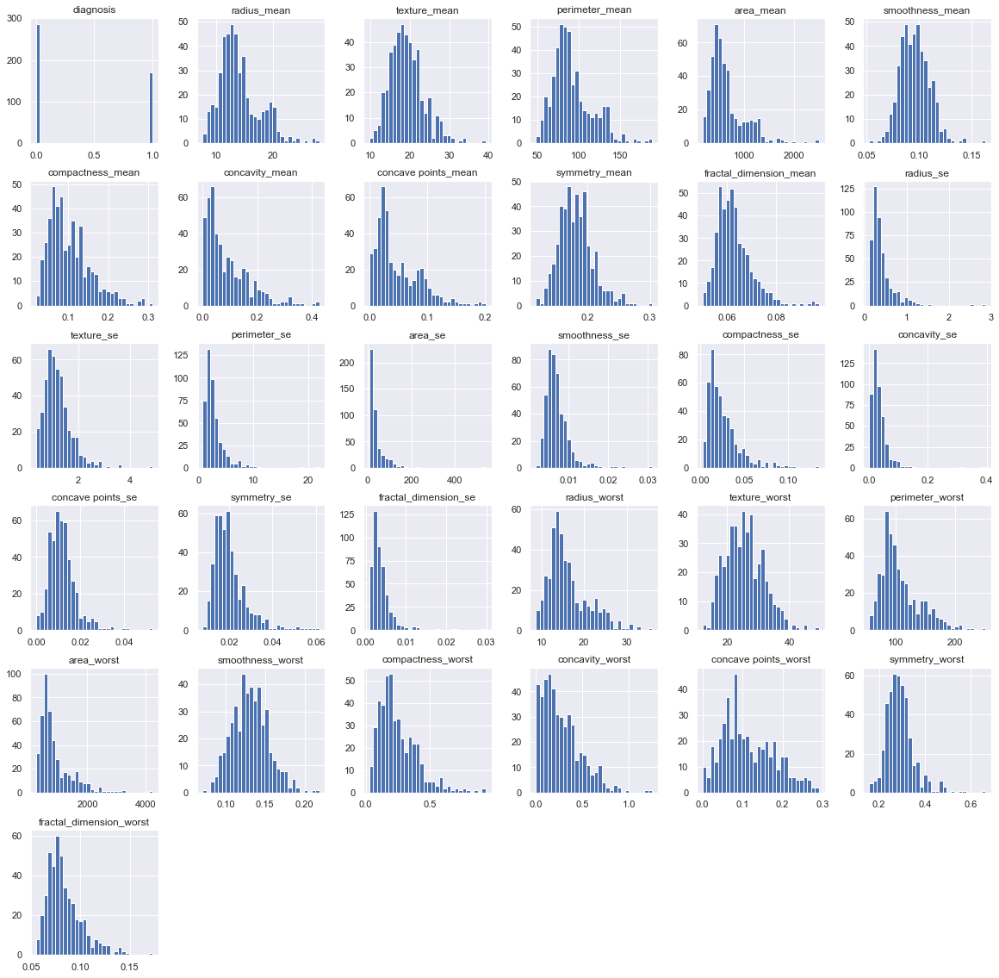

In [11]:
df_train_full.hist(bins=30, figsize=(20,20));

## Outliers

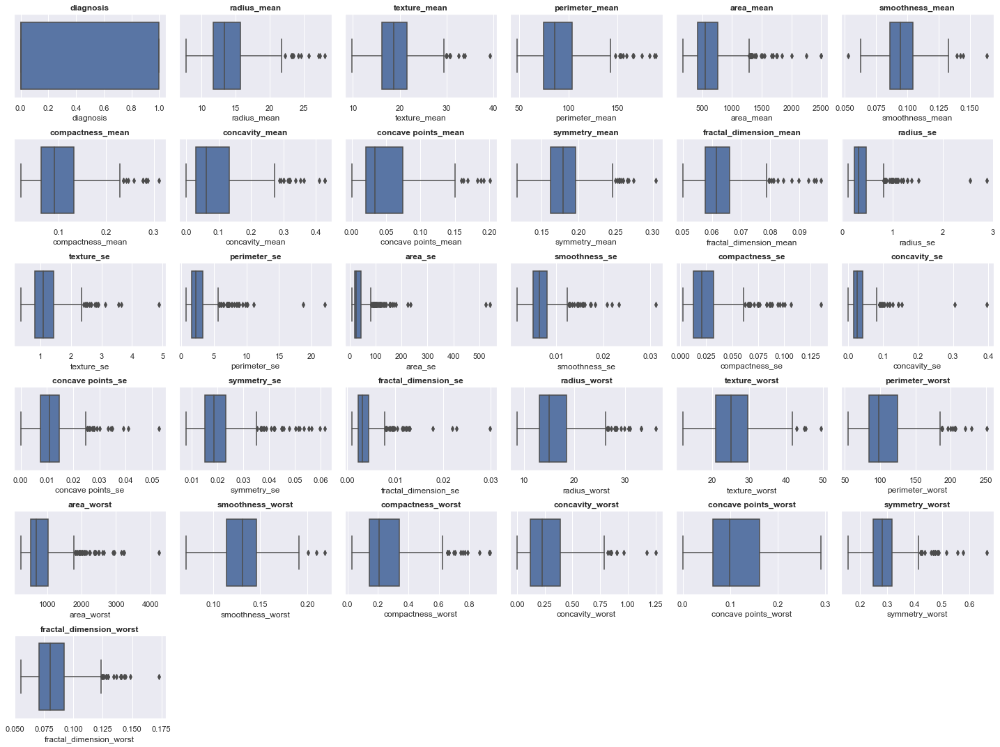

In [12]:
plt.figure(figsize=(20, 15))  

for i, column in enumerate(df_train_full.columns):
    plt.subplot(6, 6, i + 1)  # Adjust the subplot layout based on your number of features(nrows, ncols, index)
    sns.boxplot(x=df_train_full[column], orient='h')
    plt.title(column , fontweight="bold")

plt.tight_layout()
plt.show()

In [13]:
# # IQR
# Q1 = np.percentile(df_train_full['area_se'], 25,
#                    interpolation = 'midpoint')
 
# Q3 = np.percentile(df_train_full['area_se'], 75,
#                    interpolation = 'midpoint')
# IQR = Q3 - Q1
 
# print("Old Shape: ", df_train_full.shape)
# print("Q1: ", Q1)
# print("Q3: ", Q3)

# # Upper bound
# upper=Q3+1.5*IQR
# upper_array=np.array(df_train_full['area_se']>=upper)
# # Lower bound
# lower=Q1-1.5*IQR
# lower_array=np.array(df_train_full['area_se']<=lower)
# # Removing the outliers
# # nyc.drop(upper_array[0],inplace=True)
# # nyc.drop(lower_array[0],inplace=True)
 
# print("New Shape: ", nyc.shape)

## Histograms

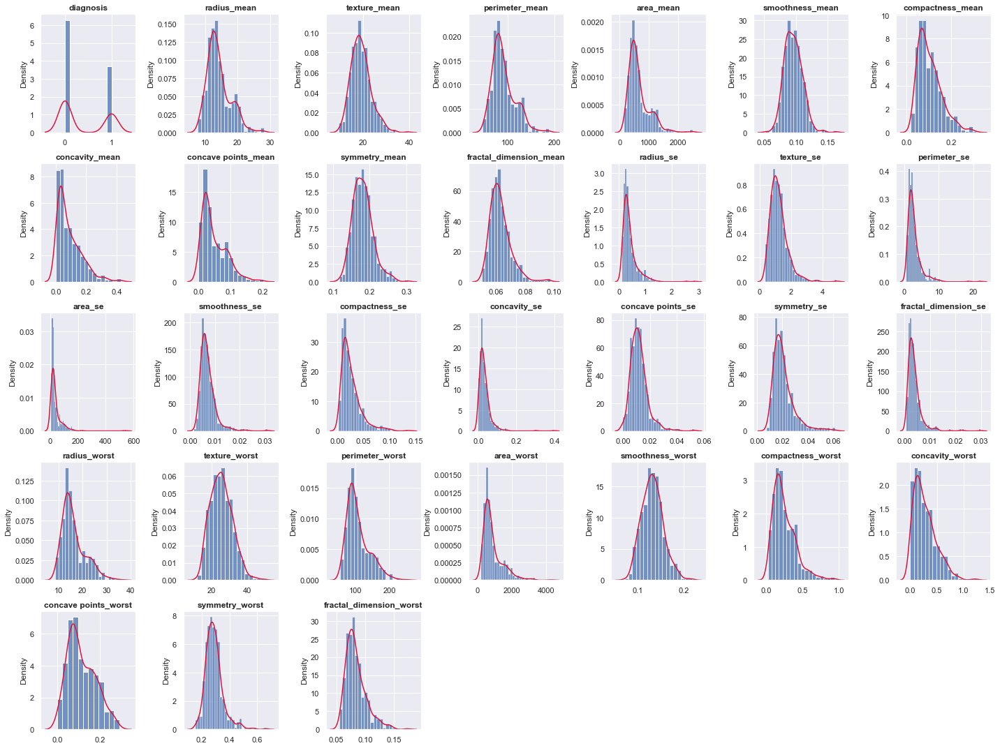

In [14]:
plt.figure(figsize=(20, 15))  

for i, column in enumerate(df_train_full.columns):
    plt.subplot(5, 7, i + 1)  # Adjust the subplot layout based on your number of features(nrows, ncols, index)
    ax = sns.histplot(data=df_train_full, x=column, kde=False, stat='density')
    sns.kdeplot(data=df_train_full, x=column, color='crimson', ax=ax)
    plt.xlabel('')
    plt.title(column , fontweight="bold")

plt.tight_layout()
plt.show()

C:\Users\sokin\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\sokin\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


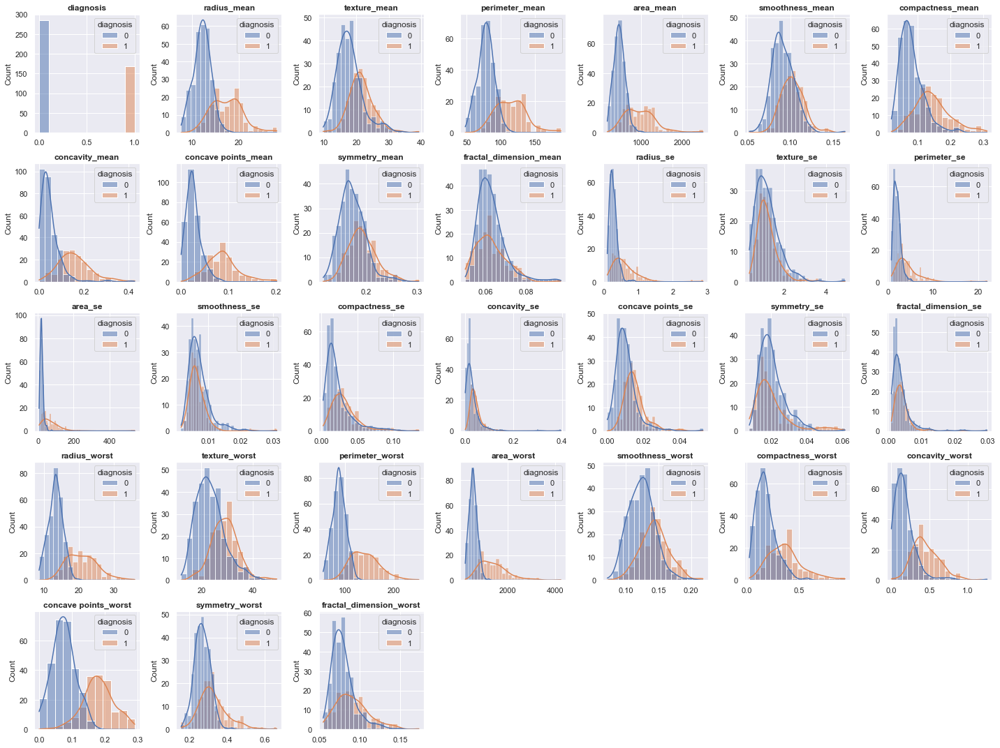

In [15]:
plt.figure(figsize=(20, 15))  

for i, column in enumerate(df_train_full.columns):
    plt.subplot(5, 7, i + 1)  # Adjust the subplot layout based on your number of features(nrows, ncols, index)
    sns.histplot(data=df_train_full, x=column, kde=True, hue='diagnosis')
#     sns.kdeplot(data=df_train_full, x=column, hue='diagnosis', color='crimson', ax=ax)
    plt.xlabel('')
    plt.title(column , fontweight="bold")

plt.tight_layout()
plt.show()

### Test Gaussianity
 - **Shapiro-Wilk** Test: The Shapiro-Wilk test is a statistical test that assesses whether a given sample follows a Gaussian distribution. It returns a p-value, and if the p-value is below a certain significance level (e.g., 0.05), you can reject the null hypothesis that the data is normally distributed.
 - **Anderson-Darling** Test: The Anderson-Darling test is another statistical test for assessing whether a sample comes from a particular distribution, including the Gaussian distribution. It also returns a p-value.
 - **Kullback-Leibler Divergence**: KL divergence is a measure of the difference between two probability distributions. You can calculate the KL divergence between your data distribution and a Gaussian distribution and use it as a quantitative measure of divergence.
 - **Kolmogorov-Smirnov (KS)** test statistic, which provides a quantifiable measure of the maximum difference between the cumulative distribution function (CDF) of your data and the CDF of a Gaussian distribution. The KS test is used to assess how closely your data follows a Gaussian distribution. =>  A high KS statistic suggests significant dissimilarity between the datasets, while a low value suggests similarity. The threshold for what is considered "high" or "low" depends on your specific analysis.The KS statistic can theoretically range from 0 to infinity. However, in practice, its range is typically between 0 and 1. A smaller value of D indicates that the two distributions are more similar (i.e., less deviation), while a larger value indicates greater dissimilarity (i.e., more deviation).
 - **Cramér-von Mises test**
 
 from scipy.stats import shapiro, anderson, norm, ks_2samp

In [113]:
from scipy.stats import ks_2samp, anderson
import numpy as np
import statsmodels.api as sm

# Sample data (replace with your own data)
data = np.random.normal(0, 1, 1000)  # Example data from a Gaussian distribution

# Fit a Gaussian distribution to your data (you can use mean and std from your data)
mu, std = np.mean(data), np.std(data)

# Generate a Gaussian distribution with the same mean and standard deviation as your data
gaussian_data = np.random.normal(mu, std, 1000)

# Calculate the KS test statistic and p-value
ks_statistic, p_value = ks_2samp(df_train_full.smoothness_mean, gaussian_data)
# dist = anderson(df_train_full.smoothness_mean, dist='norm')

# Perform the Anderson-Darling test to test for normality
result = stats.anderson(df_train_full.smoothness_mean)

# Extract the Anderson-Darling statistic and critical values
ad_statistic = result.statistic
ad_critical_values = result.critical_values

# The KS statistic quantifies the maximum difference between the two CDFs
print("KS Statistic:", ks_statistic)
print("P-Value:", p_value)
print(ad_critical_values)

# Compare the Anderson-Darling statistic to the critical values
if ad_statistic > ad_critical_values[2]:
    print("Reject the null hypothesis: Data does not follow a normal distribution.")
else:
    print("Fail to reject the null hypothesis: Data follows a normal distribution.")


KS Statistic: 0.526
P-Value: 1.4432899320127035e-15
[0.571 0.65  0.78  0.91  1.083]
Reject the null hypothesis: Data does not follow a normal distribution.


In [114]:
result.critical_values

array([0.571, 0.65 , 0.78 , 0.91 , 1.083])

# Feature importance: pearson correlation for numerical values

In [474]:
list(df_train_full.columns)[:5]

['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean']

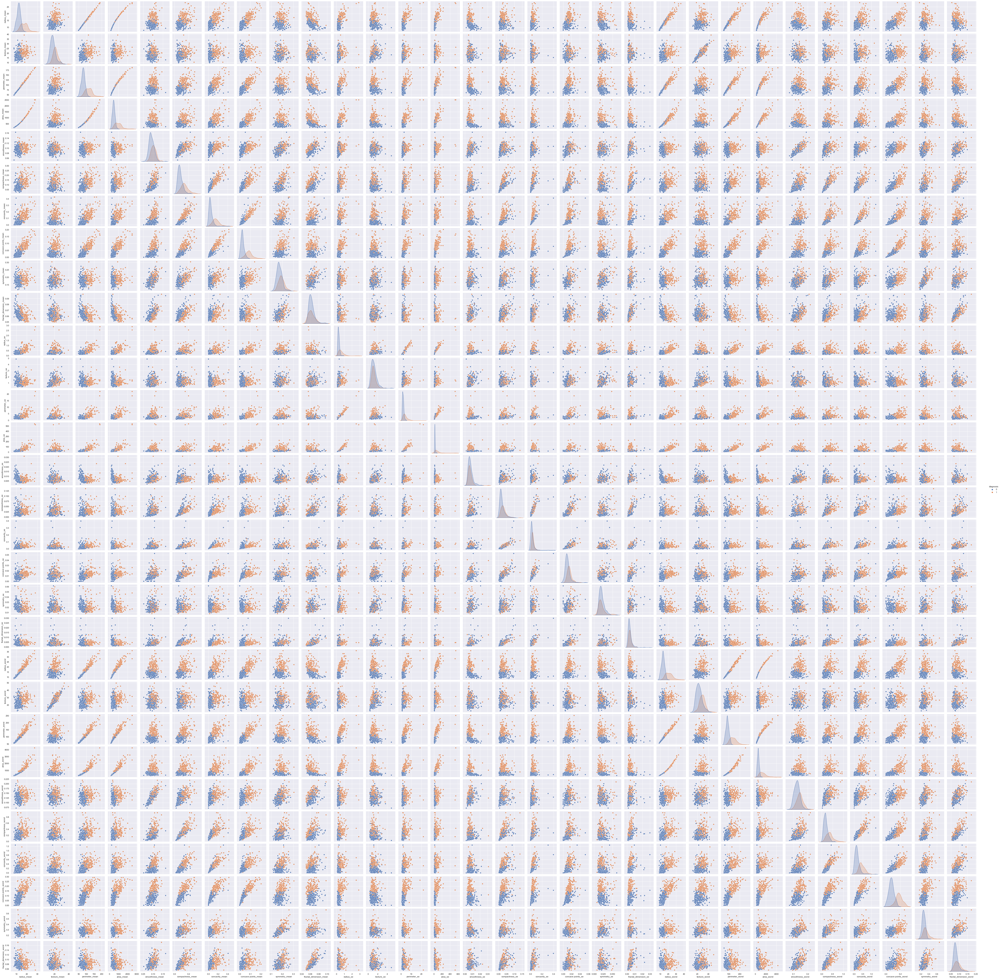

In [475]:
# num = list(df_train_full.columns)[:5]
sns.pairplot(data=df_train_full, hue='diagnosis')

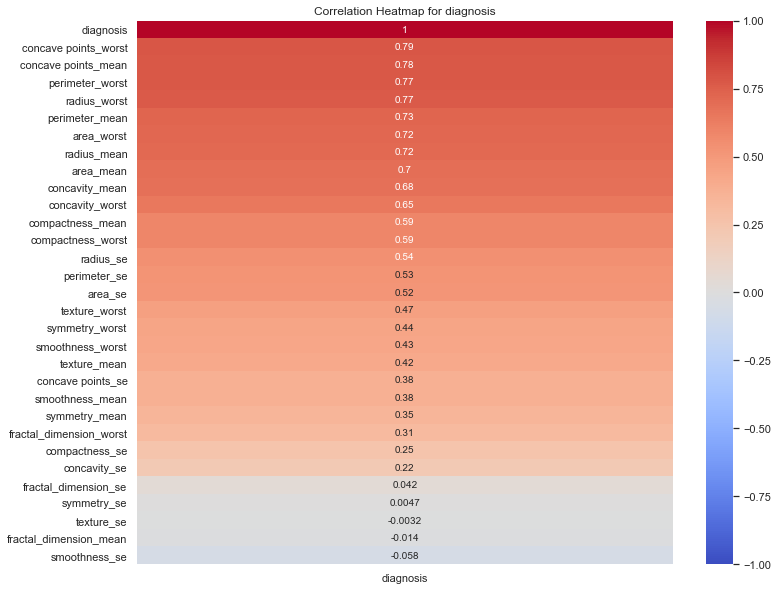

In [16]:
correlations = df_train_full.corr()[['diagnosis']].sort_values('diagnosis', ascending=False)
correlations
# Print or access the correlations
# print(correlations)
plt.figure(figsize=(12, 10))  # Adjust the figure size as needed
sns.heatmap(correlations, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title(f'Correlation Heatmap for diagnosis')
plt.show()

<AxesSubplot:xlabel='perimeter_worst', ylabel='radius_worst'>

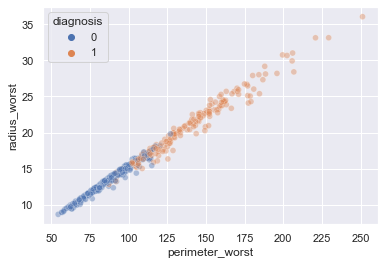

In [248]:
# perimeter, radius, area

sns.scatterplot(data=df_train_full, x='perimeter_worst', y='radius_worst', hue='diagnosis', alpha=0.4)

In [35]:
df_train_full.groupby('diagnosis').mean()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,,,,,,,,,,,,,,,,,,,,,
0,12.168056,17.821643,78.214091,464.910839,0.091733,0.079826,0.047205,0.025540,0.173751,0.062836,...,13.403259,23.358566,87.242168,561.890210,0.123904,0.182647,0.170090,0.074611,0.269150,0.079578
1,17.416923,21.492308,115.012959,975.013609,0.102531,0.143885,0.159455,0.086764,0.193533,0.062623,...,21.027456,29.220059,140.713964,1410.227811,0.144441,0.371363,0.451449,0.181149,0.326636,0.091127


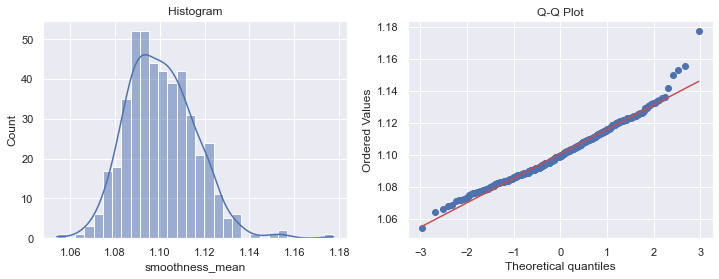

p-value: 9.434075764147565e-06 0.9806719422340393


In [81]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

# Example data (replace with your data)
data = np.random.exponential(scale=3, size=1000)
data = np.exp(df_train_full['smoothness_mean'])
# data =(df_train_full['concavity_se'])**(1/2.6)

# Plot a histogram
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(data, bins=30, kde=True, alpha=0.5)
plt.title("Histogram")

# Plot a Q-Q plot
plt.subplot(1, 2, 2)
stats.probplot(data, dist="norm", plot=plt)
plt.title("Q-Q Plot")
plt.show()

statistic, p_value = stats.shapiro(data)
print('p-value:', p_value, statistic)

In [60]:
data


68     0.265283
181    0.037989
63     0.042216
248    0.010752
60     0.007636
         ...   
71     0.055160
106    0.029025
270    0.004814
435    0.021615
102    0.010633
Name: concavity_se, Length: 455, dtype: float64

<AxesSubplot:xlabel='concavity_se'>

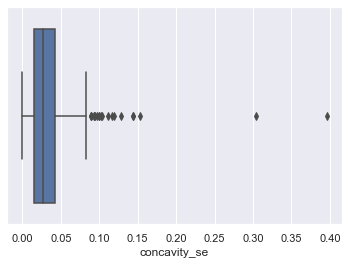

In [47]:
sns.boxplot(data=df_train_full,x='concavity_se')

# Baseline model

## Logistic Regression

In [17]:
from sklearn.linear_model import LogisticRegression

In [18]:
X_train = df_train.values
X_val = df_val.values

In [19]:
lr = LogisticRegression(random_state=42)
lr.fit(X_train, y_train)

C:\Users\sokin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=42)

In [20]:
y_pred = lr.predict(X_val)
auc_lr = roc_auc_score(y_val, y_pred)
print('AUC score:', auc_lr)
print('precision score:', precision_score(y_val, y_pred))
print('recall score:', recall_score(y_val, y_pred))
print('accuracy:', accuracy_score(y_val, y_pred))
print('\n')
print(classification_report(y_val, y_pred))

AUC score: 0.9373376623376622
precision score: 0.9111111111111111
recall score: 0.9318181818181818
accuracy: 0.9385964912280702


              precision    recall  f1-score   support

           0       0.96      0.94      0.95        70
           1       0.91      0.93      0.92        44

    accuracy                           0.94       114
   macro avg       0.93      0.94      0.94       114
weighted avg       0.94      0.94      0.94       114



In [21]:
lr.intercept_[0], 
# val_dict = df_val.to_dict(orient='records')
# X_val = dv.transform(val_dict)
# dict(zip(dv.get_feature_names(), model.coef_[0].round(3)))

(-0.15470214560569287,)

In [22]:
feature_names = df_train.columns
# Access the coefficients
coefficients = lr.coef_

# Create a dictionary to map feature names to coefficients
coef_dict = {}
for feature_name, coef in zip(feature_names, coefficients[0]):
    coef_dict[feature_name] = coef

# Print or access the coefficients for each feature along with their names
for feature_name, coef in coef_dict.items():
    print(f"Feature: {feature_name}, Coefficient: {coef}")

Feature: radius_mean, Coefficient: -0.8209551061445904
Feature: texture_mean, Coefficient: -0.21379348870520348
Feature: perimeter_mean, Coefficient: -0.31464146028462403
Feature: area_mean, Coefficient: 0.017239565776042482
Feature: smoothness_mean, Coefficient: 0.027103601850239918
Feature: compactness_mean, Coefficient: 0.14319874728960777
Feature: concavity_mean, Coefficient: 0.19983998710861683
Feature: concave points_mean, Coefficient: 0.0830404220209064
Feature: symmetry_mean, Coefficient: 0.04165877267572523
Feature: fractal_dimension_mean, Coefficient: 0.008029511967484556
Feature: radius_se, Coefficient: -0.03258397798724761
Feature: texture_se, Coefficient: -0.3318440419644516
Feature: perimeter_se, Coefficient: -0.045351017555642366
Feature: area_se, Coefficient: 0.06713139296515132
Feature: smoothness_se, Coefficient: 0.00277094822539481
Feature: compactness_se, Coefficient: 0.03224379535997027
Feature: concavity_se, Coefficient: 0.04324806699923609
Feature: concave points

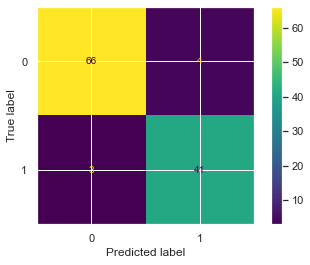

In [33]:
cm = confusion_matrix(y_val, y_pred, labels=lr.classes_)
# ConfusionMatrixDisplay

# ConfusionMatrixDisplay.from_estimator(lr, X_val, y_val)

# plt.show()

# >>> cm = confusion_matrix(y_test, predictions, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=lr.classes_)
disp.plot()

plt.show()

## Decision Trees

In [286]:
from sklearn.tree import DecisionTreeClassifier

In [287]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_pred = dt.predict(X_val)
auc_dt = roc_auc_score(y_val, y_pred)
print('AUC score:', auc_dt)
print('precision score:', precision_score(y_val, y_pred))
print('recall score:', recall_score(y_val, y_pred))
print('accuracy:', accuracy_score(y_val, y_pred))
print('\n')
print(classification_report(y_val, y_pred))

AUC score: 0.9344155844155844
precision score: 0.875
recall score: 0.9545454545454546
accuracy: 0.9298245614035088


              precision    recall  f1-score   support

           0       0.97      0.91      0.94        70
           1       0.88      0.95      0.91        44

    accuracy                           0.93       114
   macro avg       0.92      0.93      0.93       114
weighted avg       0.93      0.93      0.93       114



## Random Forest

In [288]:
from sklearn.ensemble import RandomForestClassifier

In [293]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred = rf.predict(X_val)
auc_rf = roc_auc_score(y_val, y_pred)
print('AUC score:', auc_rf)
print('precision score:', precision_score(y_val, y_pred))
print('recall score:', recall_score(y_val, y_pred))
print('accuracy:', accuracy_score(y_val, y_pred))
print('\n')
print(classification_report(y_val, y_pred))

AUC score: 0.9629870129870131
precision score: 0.9545454545454546
recall score: 0.9545454545454546
accuracy: 0.9649122807017544


              precision    recall  f1-score   support

           0       0.97      0.97      0.97        70
           1       0.95      0.95      0.95        44

    accuracy                           0.96       114
   macro avg       0.96      0.96      0.96       114
weighted avg       0.96      0.96      0.96       114



## XGBoost

In [294]:
from xgboost import XGBClassifier

In [297]:
xgb = XGBClassifier()
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_val)
auc_xgb = roc_auc_score(y_val, y_pred)
print('AUC score:', auc_dt)
print('precision score:', precision_score(y_val, y_pred))
print('recall score:', recall_score(y_val, y_pred))
print('accuracy:', accuracy_score(y_val, y_pred))
print('\n')
print(classification_report(y_val, y_pred))

AUC score: 0.9344155844155844
precision score: 0.9333333333333333
recall score: 0.9545454545454546
accuracy: 0.956140350877193


              precision    recall  f1-score   support

           0       0.97      0.96      0.96        70
           1       0.93      0.95      0.94        44

    accuracy                           0.96       114
   macro avg       0.95      0.96      0.95       114
weighted avg       0.96      0.96      0.96       114



## Use the baseline model

In [299]:
auc_lr, auc_dt, auc_rf, auc_xgb


(0.9373376623376622,
 0.9344155844155844,
 0.9629870129870131,
 0.9558441558441559)

In [303]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred = rf.predict(X_val)
# auc_rf = roc_auc_score(y_val, y_pred)
y_pred[:5], rf.predict_proba(X_val)[:5]

(array([1, 0, 0, 0, 1]),
 array([[0.  , 1.  ],
        [0.99, 0.01],
        [1.  , 0.  ],
        [1.  , 0.  ],
        [0.11, 0.89]]))

In [309]:
X_train_full, y_train_full = df_train_full.drop(['diagnosis'], axis=1).values, df_train_full.diagnosis.values


In [378]:
rf.fit(X_train_full, y_train_full)
y_pred = rf.predict(df_test.values)
print('AUC on test set:', roc_auc_score(y_pred, y_test))
print('AUC on full train set:', auc_rf)

AUC on test set: 0.9553571428571429
AUC on full train set: 0.9629870129870131


In [376]:
patient = df_test.iloc[100].values.reshape(1, 30)

In [377]:
print(y_test[100])
rf.predict_proba(patient)[:]

1


array([[0.07, 0.93]])

In [370]:
y_test[5]

1

In [407]:
# Get the feature importances
feature_importances = rf.feature_importances_

# Get the feature names from your dataset
# Assuming X_train is a DataFrame with named columns
feature_names = df_train.columns

# Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print or access the feature importances
feature_importance_df

,Feature,Importance
7,concave points_mean,0.192402
22,perimeter_worst,0.114618
27,concave points_worst,0.098867
20,radius_worst,0.091407
23,area_worst,0.076915
2,perimeter_mean,0.053708
0,radius_mean,0.050955
6,concavity_mean,0.048848
3,area_mean,0.044006
26,concavity_worst,0.041941


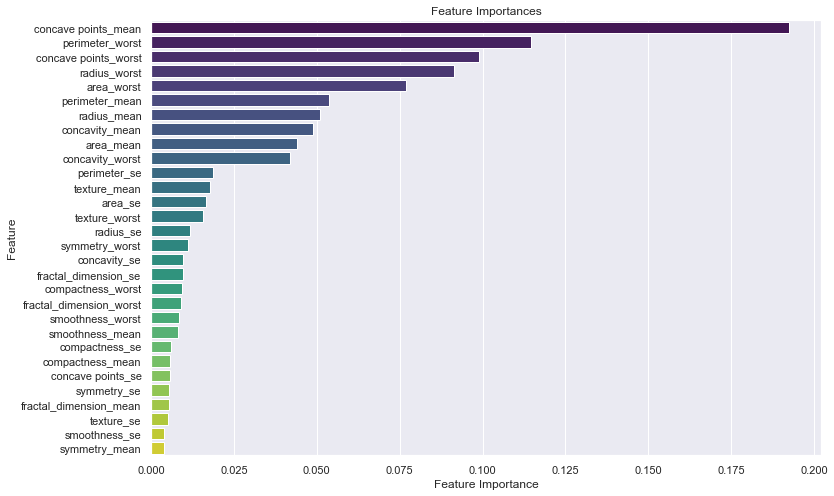

In [408]:
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.show()